#◢ Coloriza Brasil - DeOldfy
 
 Vamos Colorizar

- toc: false
- branch: master
- badges: true
- comments: false
- categories: [fastpages, jupyter]
- hide: false
- author: Eduardo Bitencourt

#◢ DeOldify - Colorize your own photos!

####**Credits:**

Special thanks to:
Jason Antic, Matt Robinson, María Benavente e Dana Kelley

In [5]:
#hide 
!git clone https://github.com/jantic/DeOldify.git DeOldify


SyntaxError: ignored

In [6]:
#hide
cd DeOldify

SyntaxError: ignored

#hide
#◢ Setup

In [7]:
#hide
#NOTE:  This must be the first call in order to work properly!
from deoldify import device
from deoldify.device_id import DeviceId
#choices:  CPU, GPU0...GPU7
device.set(device=DeviceId.GPU0)

import torch

if not torch.cuda.is_available():
    print('GPU not available.')

In [8]:
#hide 
!pip install -r requirements-colab.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 237 kB 14.9 MB/s 
     |████████████████████████████████| 125 kB 59.3 MB/s 
     |████████████████████████████████| 2.7 MB 64.4 MB/s 
     |████████████████████████████████| 631 kB 66.1 MB/s 
     |████████████████████████████████| 355 kB 66.7 MB/s 
     |████████████████████████████████| 112 kB 77.8 MB/s 
     |████████████████████████████████| 193 kB 55.3 MB/s 
     |████████████████████████████████| 2.3 MB 58.0 MB/s 
     |████████████████████████████████| 357 kB 69.6 MB/s 
  Created wheel for imgaug: filename=imgaug-0.2.6-py3-none-any.whl size=654017 sha256=9c50fb61169608331426fa0c1c5be911b59c69db5ca510101db837419ef0fe76
  Stored in directory: /root/.cache/pip/wheels/89/72/98/3ebfdba1069a9a8eaaa7ae7265cfd67d63ef0197aaee2e5f9c
  Created wheel for nvidia-ml-py3: filename=nvidia_ml_py3-7.352.0-py3-none-any.whl size=19190 sha256=d02ab705c22a44fb8cd6

In [9]:
#hide 
import fastai
from deoldify.visualize import *
import warnings
warnings.filterwarnings("ignore", category=UserWarning, message=".*?Your .*? set is empty.*?")

INFO:numexpr.utils:NumExpr defaulting to 2 threads.


NumExpr defaulting to 2 threads.


INFO:root:Generating grammar tables from /usr/lib/python3.7/lib2to3/Grammar.txt


Generating grammar tables from /usr/lib/python3.7/lib2to3/Grammar.txt


INFO:root:Generating grammar tables from /usr/lib/python3.7/lib2to3/PatternGrammar.txt


Generating grammar tables from /usr/lib/python3.7/lib2to3/PatternGrammar.txt


In [10]:
#hide 
!mkdir 'models'
!wget https://data.deepai.org/deoldify/ColorizeArtistic_gen.pth -O ./models/ColorizeArtistic_gen.pth

--2022-10-18 01:41:53--  https://data.deepai.org/deoldify/ColorizeArtistic_gen.pth
Resolving data.deepai.org (data.deepai.org)... 5.9.140.253
Connecting to data.deepai.org (data.deepai.org)|5.9.140.253|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 255144681 (243M) [application/octet-stream]
Saving to: ‘./models/ColorizeArtistic_gen.pth’

./models/ColorizeAr 100%[===================>] 243.32M   100MB/s    in 2.4s    

2022-10-18 01:41:55 (100 MB/s) - ‘./models/ColorizeArtistic_gen.pth’ saved [255144681/255144681]



In [11]:
#hide
colorizer = get_image_colorizer(artistic=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weigh

  0%|          | 0.00/83.3M [00:00<?, ?B/s]

#◢ Instruções

### 1. source_url
Insira o url do linf da imagem. 

### 2. render_factor
O valor padrão para o fator de render 35 deverá funcionar com grande maiorias dos cenários.

### 3. watermarked
Coloca um ícone de marca d'água de uma paleta no canto inferior esquerdo da imagem. Isso pretende ser uma maneira padrão de transmitir a outras pessoas que visualizam a imagem que ela é colorida pela IA. 

Queremos ajudar a promover isso como um padrão, especialmente porque a tecnologia continua a melhorar e a distinção entre real e falso se torna mais difícil de discernir. 

Essa prática de marca d'água de paleta foi iniciada e liderada pela empresa MyHeritage no recurso MyHeritage In Color (que usa uma versão mais recente do DeOldify do que a que você está usando aqui).

#### 4. How to Download a Copy
Basta clicar com o botão direito do mouse na imagem exibida e clicar em "Salvar imagem como..."!


#◢ Colorize!!

Colorização de uma foto da UFSM utilizando RedeNeural Deoldfy

Inauguração de exposição do Planetário da UFSM, Rocha Lunar trazida pela Apolo 11. Fotógrafo não identificado. UFSM.1972.278.001

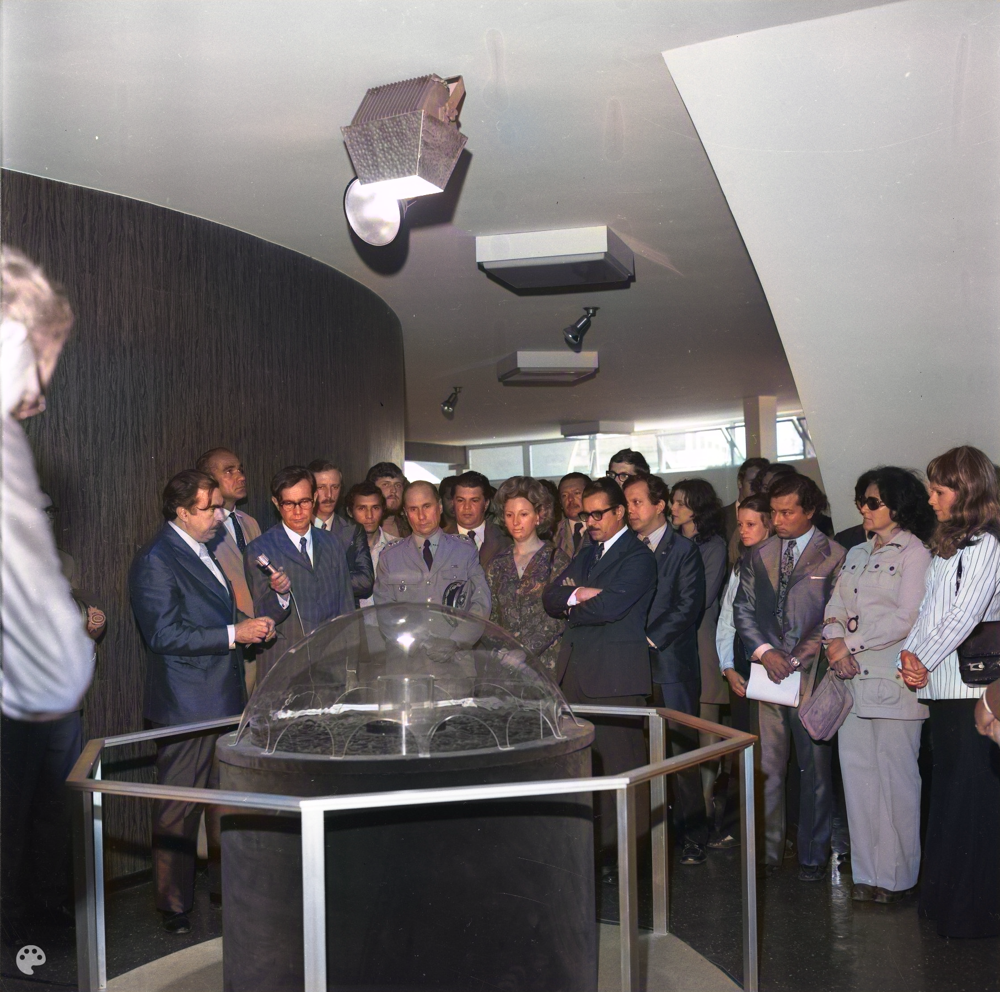

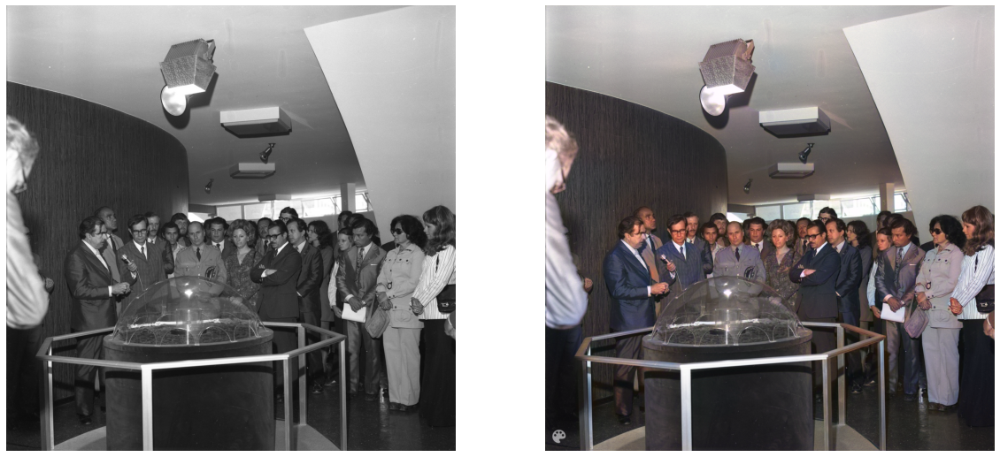

In [27]:
source_url = 'https://www.ufsm.br/app/uploads/sites/397/2021/08/UFSM.1972.278.001.jpg' #@param {type:"string"}
render_factor = 35  #@param {type: "slider", min: 7, max: 40}
watermarked = True #@param {type:"boolean"}

if source_url is not None and source_url !='':
    image_path = colorizer.plot_transformed_image_from_url(url=source_url, render_factor=render_factor, compare=True, watermarked=watermarked)
    show_image_in_notebook(image_path)
else:
    print('Provide an image url and try again.')

## Veja o desempenho dos valores render_factor na imagem aqui

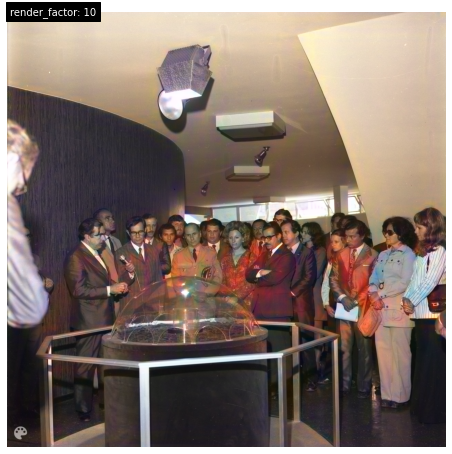

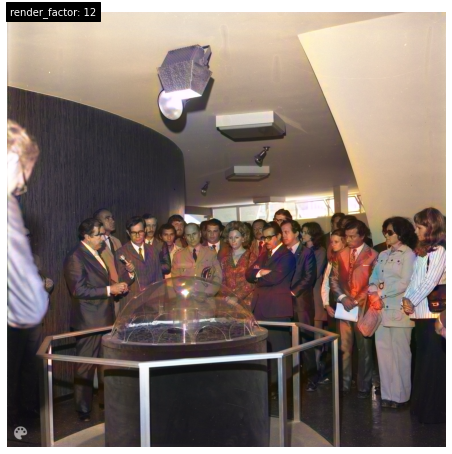

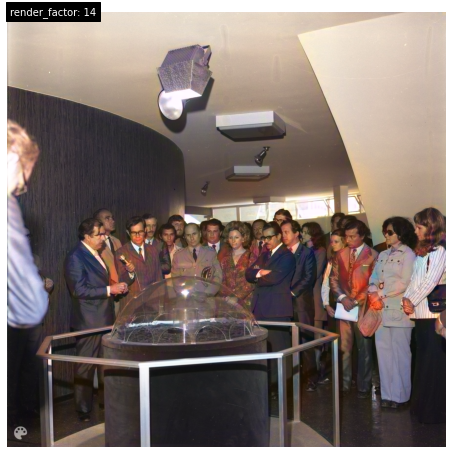

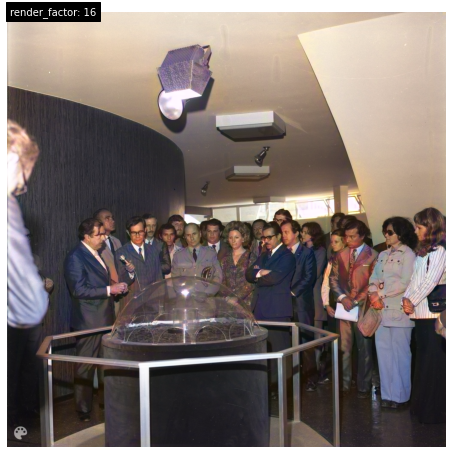

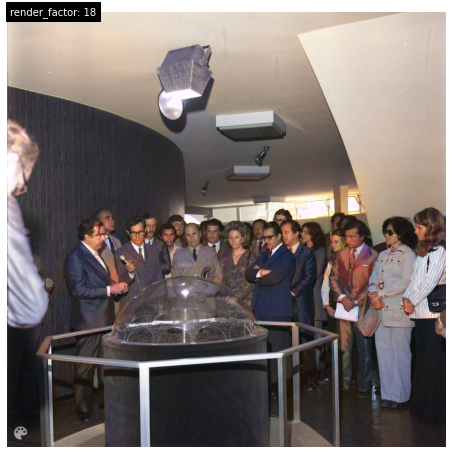

...

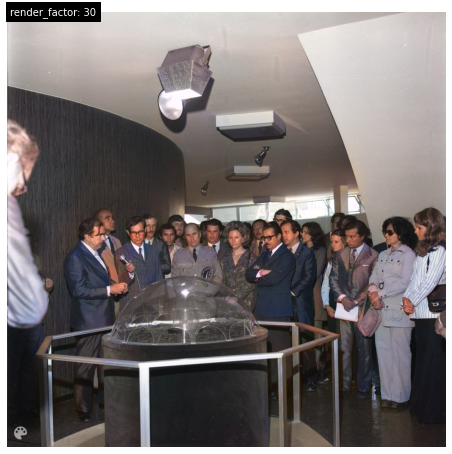

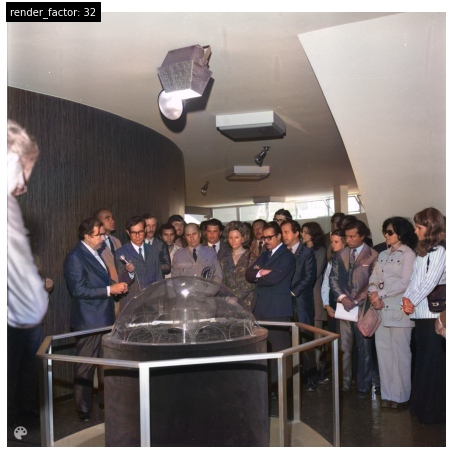

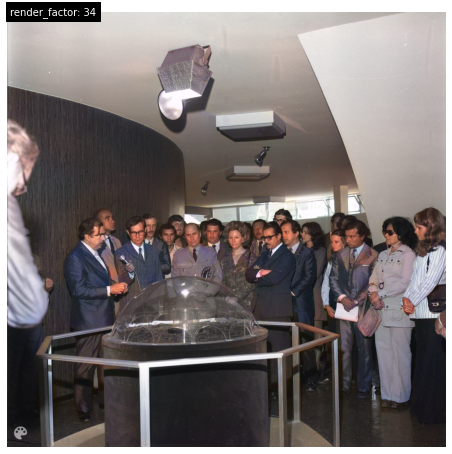

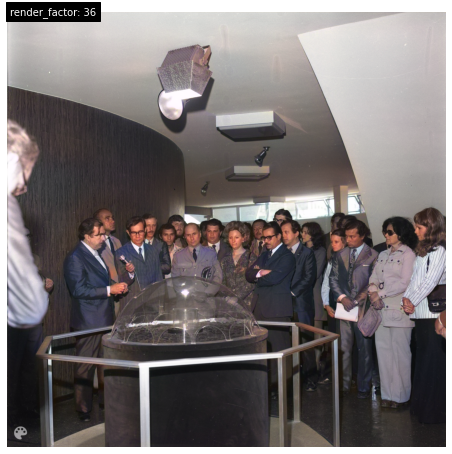

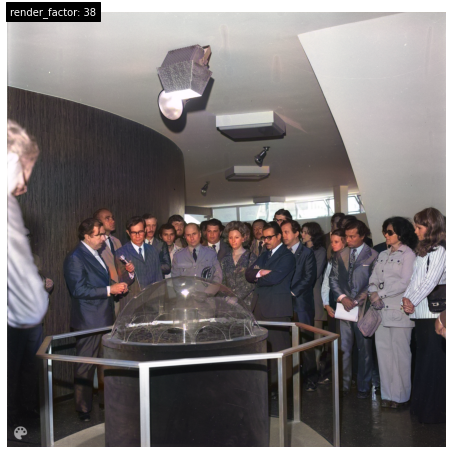

In [28]:
for i in range(10,40,2):
    colorizer.plot_transformed_image('test_images/image.png', render_factor=i, display_render_factor=True, figsize=(8,8))

---
#⚙ Recommended